# 1. Import Libraries and Load Dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

The dataset contains details of customers for a given bank. Features include demographics, income, and product engagement measures. There are a total of 10K observations, spanning 14 columns. The target variable is 'Exited' which identifies if a person is no longer a bank customer.

In [2]:
df = pd.read_csv(r"data/archive/Churn_Modelling.csv")
df.head(2)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0


# 2. Check Dataset for Missing Values and Column Data Types

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


### 1A. Remove Identifier columns

In [4]:
cols_to_remove = ['RowNumber', #row identifier
                 'CustomerId', #unique customer identifier
                 'Surname' #unique customer identifier
                 ]

df = df.drop(columns=cols_to_remove)

In [5]:
df.head(2)

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0


### 1A. Checking Target Variable

In [6]:
#Identify target column cardinality.
df['Exited'].unique()

array([1, 0])

The dataset exhibits an extreme class imbalance. Decision Tree algorithm are known to not perform well with class imbalance. A technique such as SMOTE or stratified undersampling will need to be done.

In [7]:
df['Exited'].value_counts()

0    7963
1    2037
Name: Exited, dtype: int64

### 1B. Encode Categorical Features
To enconde categorical variables we'll employ Pandas' get_dummies()

In [8]:
cols_to_enc = ['Geography', 'Gender']
df = pd.get_dummies(df, columns=cols_to_enc)

### 1C. Fix Class Imbalance

#### Option1 : Undersample majority class

In [9]:
#Balance the dataset by undersampling the majority class (Malicious Type)
df_majority = df[df['Exited']==0]
df_minority = df[df['Exited']==1]
from sklearn.utils import resample,shuffle
df_majority_undersampled = resample(df_majority, #undersample majority class
                                    replace=False,    # sample without replacement
                                    n_samples=len(df_minority),  # to match minority class
                                    random_state=40) # reproducible results
df_undersampled = pd.concat([df_majority_undersampled, df_minority]) #combine classes

In [10]:
df_undersampled['Exited'].value_counts()

0    2037
1    2037
Name: Exited, dtype: int64

#### Option2: Employ SMOTE
See below for each training segment

# 3. Fit Decision Tree 1
https://www.datacamp.com/tutorial/decision-tree-classification-python

Model Includes all features. Between undersampling and SMOTE, SMOTE yielded better results

In [11]:
# Load DT libraries
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculatio

#### Model1: DT - Undersampled Model

In [12]:
feature_cols1 = []
X1_undersampled = df_undersampled.drop(['Exited'], axis=1)
y1_undersampled = df_undersampled['Exited']

In [13]:
X1_train_undersampled, X1_test_undersampled, y1_train_undersampled, y1_test_undersampled = train_test_split(X1_undersampled, 
                                                                                                            y1_undersampled, 
                                                                                                            test_size=0.2, 
                                                                                                            random_state=40)

In [14]:
param_grid = {
    'max_depth': [10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

In [15]:
#Initialize model and gridsearch
from sklearn.model_selection import GridSearchCV
clf1_undersamp = DecisionTreeClassifier(splitter = 'best',random_state=40)
grid_search1 = GridSearchCV(estimator=clf1_undersamp, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

#fit the gridsearch
gs_res1 = grid_search1.fit(X1_train_undersampled, y1_train_undersampled)

#Pring best param details
print("Best parameters:", gs_res1.best_params_)
print("Best cross-validation score: {:.2f}".format(gs_res1.best_score_))

Best parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best cross-validation score: 0.74


In [16]:
#eval the model with the best params
from sklearn.metrics import accuracy_score
best_model1 = gs_res1.best_estimator_
predictions1 = best_model1.predict(X1_test_undersampled)

accuracy1 = accuracy_score(y1_test_undersampled, predictions1)
print("Test set accuracy: {:.2f}".format(accuracy1))

Test set accuracy: 0.74


In [17]:
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, classification_report

fpr, tpr, thresholds = roc_curve(y1_test_undersampled, predictions1)
roc_auc = auc(fpr, tpr)

#performance scores
report_df1 = pd.DataFrame(classification_report(y1_test_undersampled, 
                                                predictions1, 
                                                output_dict=True)).transpose()
report_df1

,precision,recall,f1-score,support
0,0.717593,0.778894,0.746988,398.000000
1,0.770235,0.707434,0.737500,417.000000
accuracy,0.742331,0.742331,0.742331,0.742331
macro avg,0.743914,0.743164,0.742244,815.000000
weighted avg,0.744527,0.742331,0.742133,815.000000


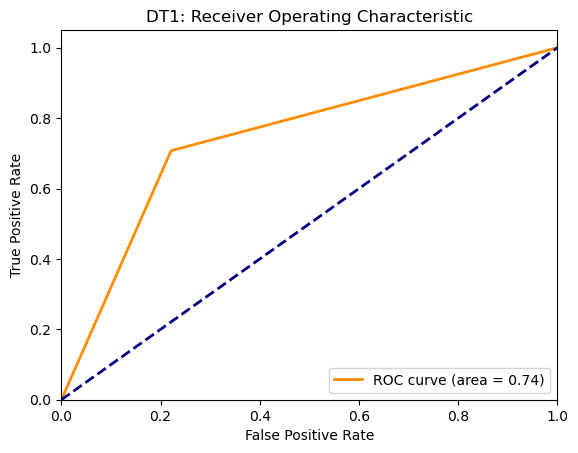

In [18]:
#plot
# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('DT1: Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.savefig('DT1_ROC_Undersampled.png')
plt.show()

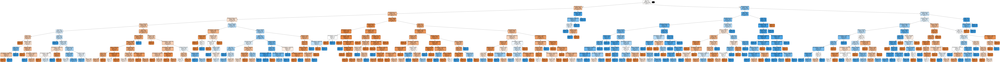

In [19]:
#View tree
from sklearn.tree import export_graphviz
import io
from IPython.display import Image
import pydotplus

# Use io.StringIO instead of the one from sklearn.externals.six
dot_data = io.StringIO()
export_graphviz(best_model1, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X1_undersampled.columns, class_names=['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('DT1_mod_undersampled_viz.png')
Image(graph.create_png())

#### Model2: DT - SMOTE Model

In [20]:
from imblearn.over_sampling import SMOTE
from collections import Counter

X1_sm = df.drop(['Exited'], axis=1)
y1_sm = df['Exited']

X1_train_sm, X1_test_sm, y1_train_sm, y1_test_sm = train_test_split(X1_sm, y1_sm, test_size=0.25, random_state=40)

sm = SMOTE(random_state=40)
X1_train_sm, y1_train_sm = sm.fit_resample(X1_train_sm, y1_train_sm)

print("Resampled dataset shape %s" % Counter(y1_train_sm))

Resampled dataset shape Counter({0: 5952, 1: 5952})


In [21]:
param_grid = {
    'max_depth': [10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

In [22]:
#Initialize model and gridsearch
from sklearn.model_selection import GridSearchCV
clf1_sm = DecisionTreeClassifier(splitter = 'best',random_state=40)
grid_search2 = GridSearchCV(estimator=clf1_sm, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

#fit the gridsearch
gs_res2 = grid_search2.fit(X1_train_sm, y1_train_sm)

#Pring best param details
print("Best parameters:", gs_res2.best_params_)
print("Best cross-validation score: {:.2f}".format(gs_res2.best_score_))

Best parameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5}
Best cross-validation score: 0.84


In [23]:
#eval the model with the best params
from sklearn.metrics import accuracy_score
best_model2 = gs_res2.best_estimator_
predictions2 = best_model2.predict(X1_test_sm)

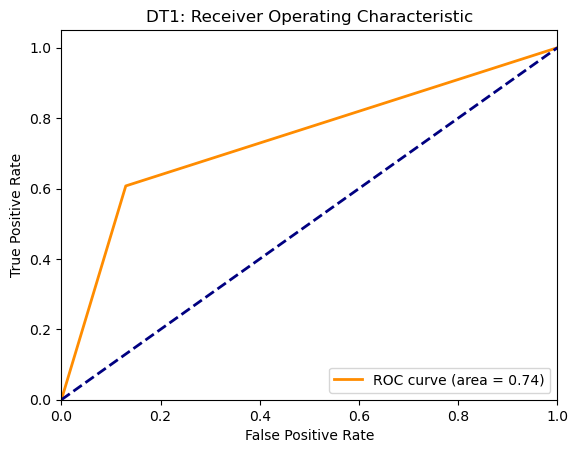

In [24]:
#confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, classification_report

fpr, tpr, thresholds = roc_curve(y1_test_sm, predictions2)
roc_auc = auc(fpr, tpr)

#plot
# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('DT1: Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.savefig('DT1_ROC_SMOTE.png')
plt.show()

In [25]:
#performance scores
report_df2 = pd.DataFrame(classification_report(y1_test_sm, 
                                                predictions2, 
                                                output_dict=True)).transpose()
report_df2

,precision,recall,f1-score,support
0,0.901133,0.870214,0.885403,2011.0000
1,0.532258,0.607362,0.567335,489.0000
accuracy,0.818800,0.818800,0.818800,0.8188
macro avg,0.716695,0.738788,0.726369,2500.0000
weighted avg,0.828981,0.818800,0.823189,2500.0000


#### View Tree of Model Selection

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.641497 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.641497 to fit



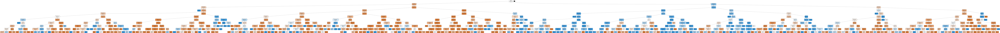

In [26]:
#View tree
from sklearn.tree import export_graphviz
import io
from IPython.display import Image
import pydotplus

# Use io.StringIO instead of the one from sklearn.externals.six
dot_data = io.StringIO()
export_graphviz(best_model2, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X1_sm.columns, class_names=['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('DT1_mod_smote_viz.png')
Image(graph.create_png())

# 4. Fit Decision Tree 2
Employing the dataset with SMOTE. Set splitter= 'random' which resulted in 'IsActiveMember" replacing 'Age' as the root node.

In [27]:
X2_sm = df.drop('Exited', axis=1)
y2_sm = df['Exited']

X2_train_sm, X2_test_sm, y2_train_sm, y2_test_sm = train_test_split(X2_sm, y2_sm, test_size=0.25, random_state=40)

sm = SMOTE(random_state=40)
X2_train_sm, y2_train_sm = sm.fit_resample(X2_train_sm, y2_train_sm)

print("Resampled dataset shape %s" % Counter(y2_train_sm))

Resampled dataset shape Counter({0: 5952, 1: 5952})


In [28]:
param_grid = {
    'max_depth': [10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

In [29]:
#Initialize model and gridsearch
from sklearn.model_selection import GridSearchCV
clf2_sm = DecisionTreeClassifier(splitter = 'random',random_state=40)
grid_search3 = GridSearchCV(estimator=clf2_sm, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1)

#fit the gridsearch
gs_res3 = grid_search3.fit(X1_train_undersampled, y1_train_undersampled)

#Pring best param details
print("Best parameters:", gs_res3.best_params_)
print("Best cross-validation score: {:.2f}".format(gs_res3.best_score_))

Best parameters: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 10}
Best cross-validation score: 0.75


In [30]:
#eval the model with the best params
from sklearn.metrics import accuracy_score
best_model3 = gs_res3.best_estimator_
predictions3 = best_model3.predict(X1_test_undersampled)

accuracy3 = accuracy_score(y1_test_undersampled, predictions3)
print("Test set accuracy: {:.2f}".format(accuracy3))

Test set accuracy: 0.71


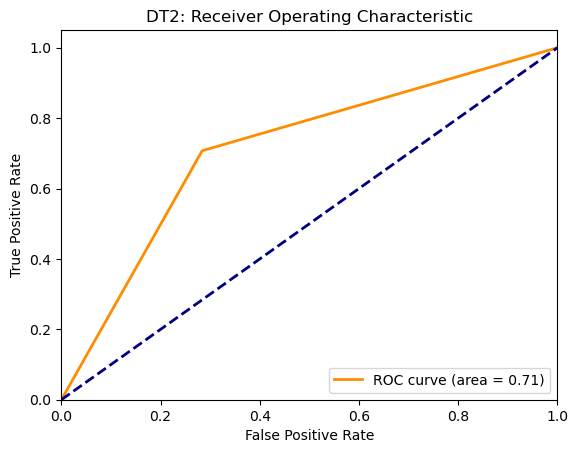

In [31]:
#confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, classification_report

fpr, tpr, thresholds = roc_curve(y1_test_undersampled, predictions3)
roc_auc = auc(fpr, tpr)

#plot
# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('DT2: Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.savefig('DT2_ROC_UNDERSAMPLED.png')
plt.show()

In [32]:
#performance scores
report_df3 = pd.DataFrame(classification_report(y1_test_undersampled, 
                                                predictions3, 
                                                output_dict=True)).transpose()
report_df3

,precision,recall,f1-score,support
0,0.700246,0.716080,0.708075,398.000000
1,0.723039,0.707434,0.715152,417.000000
accuracy,0.711656,0.711656,0.711656,0.711656
macro avg,0.711642,0.711757,0.711613,815.000000
weighted avg,0.711908,0.711656,0.711696,815.000000


In [33]:
#View tree
from sklearn.tree import export_graphviz
import io
from IPython.display import Image
import pydotplus

# Use io.StringIO instead of the one from sklearn.externals.six
dot_data = io.StringIO()
export_graphviz(best_model3, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True, feature_names=X1_undersampled.columns, class_names=['0', '1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('DT2_mod_undersampled_viz.png')
Image(graph.create_png())

# 4. Fit Random Forests Model
Employ SMOTE.

In [34]:
#Load Libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

In [35]:
X3 = df.drop('Exited', axis=1)
y3 = df['Exited']

X3_train_sm, X3_test_sm, y3_train_sm, y3_test_sm = train_test_split(X3, y3, test_size=0.2)

sm = SMOTE(random_state=40)
X3_train_sm, y3_train_sm = sm.fit_resample(X3_train_sm, y3_train_sm)

print("Resampled dataset shape %s" % Counter(y3_train_sm))

Resampled dataset shape Counter({1: 6359, 0: 6359})


In [36]:
param_grid_rf = {
    "max_depth": np.arange(start=3, stop=15, step=2),  # Default = 6
    "max_features": [0.1, 0.50, 0.75, 1],  # default = 0.3
    "n_estimators": [100, 200, 500, 1000],
}

In [37]:
%%time
rf = RandomForestClassifier(random_state=40)
grid_search4 = GridSearchCV(estimator=rf, param_grid=param_grid_rf, cv=5, scoring='f1', n_jobs=-1)

#fit the gridsearch
gs_res4 = grid_search4.fit(X1_train_undersampled, y1_train_undersampled)

#Pring best param details
print("Best parameters:", gs_res4.best_params_)
print("Best cross-validation score: {:.2f}".format(gs_res4.best_score_))

Best parameters: {'max_depth': 7, 'max_features': 0.75, 'n_estimators': 100}
Best cross-validation score: 0.79
CPU times: user 1.05 s, sys: 97.7 ms, total: 1.15 s
Wall time: 1min 34s


In [38]:
#eval the model with the best params
from sklearn.metrics import accuracy_score
best_model4 = gs_res4.best_estimator_
predictions4 = best_model4.predict(X1_test_undersampled)

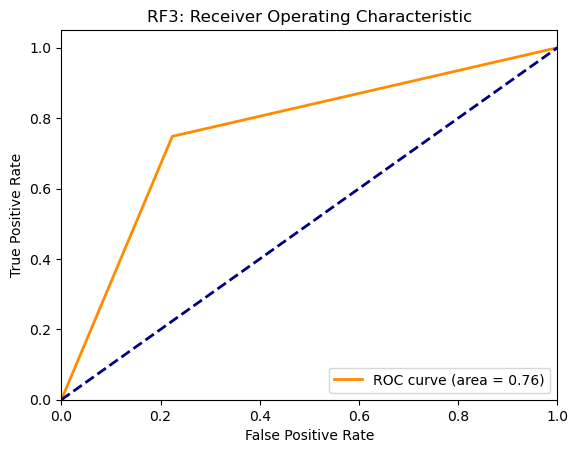

In [39]:
#confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, classification_report

fpr, tpr, thresholds = roc_curve(y1_test_undersampled, predictions4)
roc_auc = auc(fpr, tpr)

#plot
# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('RF3: Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.savefig('RF3_ROC_UNDERSAMPLED.png')
plt.show()

In [40]:
#performance scores
report_df4 = pd.DataFrame(classification_report(y1_test_undersampled, 
                                                predictions4, 
                                                output_dict=True)).transpose()
report_df4

,precision,recall,f1-score,support
0,0.746377,0.776382,0.761084,398.000000
1,0.778055,0.748201,0.762836,417.000000
accuracy,0.761963,0.761963,0.761963,0.761963
macro avg,0.762216,0.762292,0.761960,815.000000
weighted avg,0.762585,0.761963,0.761980,815.000000


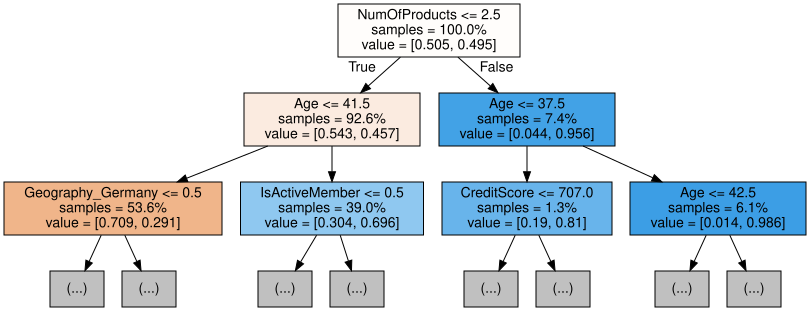

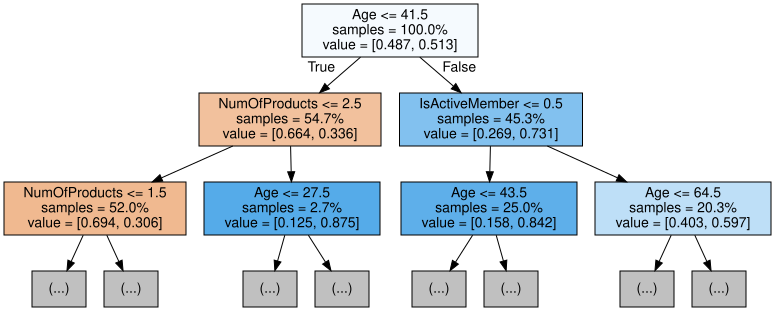

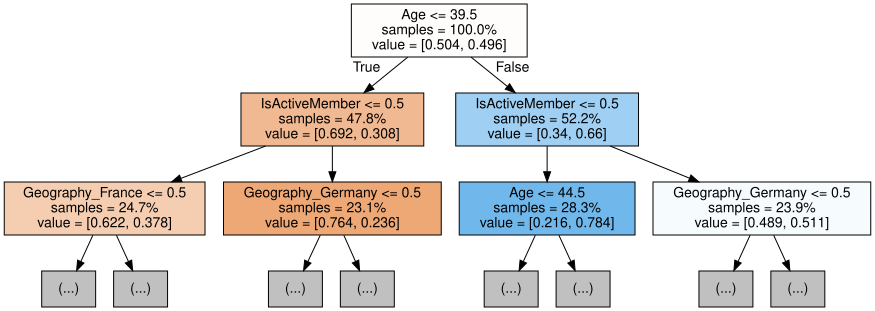

In [42]:
# View Results
import graphviz

for i in range(3):
    tree = best_model4.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X1_train_undersampled.columns,  
                               filled=True,  
                               max_depth=2, 
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    graph.render(filename=f'tree_{i}_RF_mod_undersampled_viz', format='png', cleanup=True)
    display(graph)